# DocLayout-YOLO PDF Layout Analysis

Automatically detect layout elements in PDFs (titles, text, figures, tables) and extract text with OCR.

**What you'll get:**
- Annotated images showing detected elements
- JSON file with extracted text and structure
- Visual verification of reading order

**Time:** ~2 min with GPU (15 pages), ~20 min on CPU

Put your PDF in `data/` folder and run the cells.

## TL;DR - Quick Demo

Want to see it work in 30 seconds? Just run the cell below (no other cells needed):

In [18]:
# Quick standalone demo - works without running other cells
from doclayout_yolo import YOLOv10
from huggingface_hub import hf_hub_download
from pathlib import Path
from PIL import Image
import fitz  # PyMuPDF

# Find first PDF in data folder
pdf_files = list(Path("../data").glob("*.pdf"))
if not pdf_files:
    print("No PDF found in data/ folder. Add a PDF and try again.")
else:
    pdf_path = pdf_files[0]
    print(f"Processing: {pdf_path.name}")
    
    # Convert first page to image
    pdf_doc = fitz.open(str(pdf_path))
    page = pdf_doc[0]
    pix = page.get_pixmap(matrix=fitz.Matrix(2, 2))  # 2x zoom = ~200 DPI
    img_data = pix.tobytes("ppm")
    img = Image.frombytes("RGB", [pix.width, pix.height], img_data)
    pdf_doc.close()
    
    # Save temp image
    temp_img_path = Path("../tmp/demo_page.png")
    temp_img_path.parent.mkdir(exist_ok=True)
    img.save(temp_img_path)
    
    # Download and load model
    print("Loading model...")
    model_filepath = hf_hub_download(
        repo_id="juliozhao/DocLayout-YOLO-DocStructBench",
        filename="doclayout_yolo_docstructbench_imgsz1024.pt"
    )
    model = YOLOv10(model_filepath)
    
    # Detect layout on first page
    results = model.predict(str(temp_img_path), imgsz=1024, conf=0.2, device="cpu")
    
    # Show results
    results[0].show()
    print(f"\nDetected {len(results[0].boxes)} layout elements on page 1!")
    
    # Cleanup
    temp_img_path.unlink()

Processing: 2410.12628v1.pdf
Loading model...

image 1/1 d:\projects\doclayoutyolo\notebooks\..\tmp\demo_page.png: 1024x800 3 titles, 5 plain texts, 3 abandons, 1513.6ms
Speed: 7.8ms preprocess, 1513.6ms inference, 1.0ms postprocess per image at shape (1, 3, 1024, 800)

Detected 11 layout elements on page 1!


## Setup

Import libraries and install PyMuPDF for PDF handling.

In [1]:
# Import required libraries
import os
import sys
from pathlib import Path
from typing import List, Dict, Tuple
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np

import warnings
warnings.filterwarnings("ignore")

# Import DocLayout-YOLO
from doclayout_yolo import YOLOv10

# Use PyMuPDF (fitz) for PDF handling - works natively on Windows without poppler
print("Checking dependencies...")
try:
    import fitz  # PyMuPDF
except ImportError:
    print("Installing PyMuPDF for PDF processing...")
    import subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "PyMuPDF"])
    import fitz

print("Dependencies loaded")

Checking dependencies...
Dependencies loaded


## Load Model

Download the pre-trained model from HuggingFace (fine-tuned on DocStructBench). Works with academic papers, reports, forms, etc. Gets cached locally after first download.

In [ ]:
# Download and load pre-trained DocLayout-YOLO model from HuggingFace
# This model is fine-tuned on DocStructBench and can handle various document types
from huggingface_hub import hf_hub_download

print("Downloading DocLayout-YOLO model from HuggingFace...")
model_filepath: str = hf_hub_download(
    repo_id="juliozhao/DocLayout-YOLO-DocStructBench",
    filename="doclayout_yolo_docstructbench_imgsz1024.pt"
)

print("Loading model...")
model = YOLOv10(model_filepath)
print("Model loaded successfully!")

Loading model...
Model loaded successfully!


## Check GPU

See if CUDA is available. GPU makes this 10-20x faster than CPU.

In [3]:
# Check available device (CUDA GPU or CPU)
import torch

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"CUDA version (built with): {torch.version.cuda}")

if torch.cuda.is_available():
    device: str = "cuda:0"
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f} GB")
else:
    device: str = "cpu"
    print("\nWARNING: CUDA not available!")


print(f"\nUsing device: {device}")

PyTorch version: 2.9.0+cpu
CUDA available: False
CUDA version (built with): None


Using device: cpu


If you see `device: cpu` but have an NVIDIA GPU, PyTorch might be installed without CUDA. To fix:

```bash'
pip uninstall torch torchvision
pip install torch torchvision --index-url https://download.pytorch.org/whl/cu118
```

Then restart the kernel.

### Common Issues

**Slow processing?** That's normal on CPU. Consider Google Colab with free GPU.

**Out of memory?** Reduce `imgsz=800` or process fewer pages at once.

**CUDA not found?** See the cell above for PyTorch reinstall instructions.


### About the Model

DocLayout-YOLO is based on YOLOv10, trained on DocSynth300K and fine-tuned on DocStructBench.

Detects: text blocks, titles, figures, tables, captions, lists, equations, footnotes.

Config: 1024px image size, 0.2 confidence threshold.

## Process PDF

Finds the first PDF in `data/` folder and converts pages to images.

In [4]:
# Define PDF path
pdf_directory: Path = Path("../data")
pdf_files: List[Path] = list(pdf_directory.glob("*.pdf"))

if not pdf_files:
    raise FileNotFoundError(f"No PDF files found in {pdf_directory}")

pdf_path: Path = pdf_files[0]
print(f"Processing PDF: {pdf_path.name}")

Processing PDF: 2410.12628v1.pdf


Convert pages to images at ~200 DPI (model needs images, not raw PDFs).

In [5]:
# Convert PDF to images using PyMuPDF (works natively on Windows)
print("Converting PDF pages to images...")
pdf_document = fitz.open(str(pdf_path))
pdf_page_images: List[Image.Image] = []

# Convert each page to an image with high resolution
zoom: float = 2.0  # Zoom factor for higher resolution (2.0 = ~200 DPI)
matrix = fitz.Matrix(zoom, zoom)

for page_number in range(len(pdf_document)):
    page = pdf_document[page_number]
    pixmap = page.get_pixmap(matrix=matrix)
    
    # Convert pixmap to PIL Image
    img_data = pixmap.tobytes("ppm")
    pil_image = Image.frombytes("RGB", [pixmap.width, pixmap.height], img_data)
    pdf_page_images.append(pil_image)
    print(f"  Converted page {page_number + 1}/{len(pdf_document)}")

pdf_document.close()
print(f"Converted {len(pdf_page_images)} pages to images")

Converting PDF pages to images...
  Converted page 1/15
  Converted page 2/15
  Converted page 3/15
  Converted page 4/15
  Converted page 5/15
  Converted page 6/15
  Converted page 7/15
  Converted page 8/15
  Converted page 9/15
  Converted page 10/15
  Converted page 11/15
  Converted page 12/15
  Converted page 13/15
  Converted page 14/15
  Converted page 15/15
Converted 15 pages to images


## Run Layout Detection

Batch processing all pages. Temp files go to `tmp/` and get cleaned up after.

In [6]:
# Run DocLayout-YOLO detection on all pages
print("Running layout detection...")

# Create tmp directory for temporary files
tmp_directory: Path = Path("../tmp")
tmp_directory.mkdir(exist_ok=True)
print(f"Using temporary directory: {tmp_directory}")

# Save all pages as temporary images
print("Preparing temporary image files for batch processing...")
temp_image_paths: List[str] = []
for page_index, page_image in enumerate(pdf_page_images):
    temp_image_path: str = str(tmp_directory / f"page_{page_index}.png")
    page_image.save(temp_image_path)
    temp_image_paths.append(temp_image_path)

# Perform batch prediction (more efficient than processing one by one)
print(f"Processing {len(temp_image_paths)} pages in batch mode...")
batch_detection_results = model.predict(
    temp_image_paths,
    imgsz=1024,
    conf=0.2,
    device=device
)

# Store results
detection_results: List = list(batch_detection_results)

# Clean up temporary files
print("Cleaning up temporary files...")
for temp_path in temp_image_paths:
    os.remove(temp_path)

print(f"Detection complete! Processed {len(detection_results)} pages")

Running layout detection...
Using temporary directory: ..\tmp
Preparing temporary image files for batch processing...
Processing 15 pages in batch mode...

0: 1024x800 3 titles, 5 plain texts, 3 abandons, 1440.5ms
1: 1024x800 6 plain texts, 1 abandon, 3 figures, 2 figure_captions, 1440.5ms
2: 1024x800 5 titles, 4 plain texts, 1 abandon, 1 figure, 1 figure_caption, 1440.5ms
3: 1024x800 2 titles, 10 plain texts, 1 abandon, 1 figure, 1 figure_caption, 1440.5ms
4: 1024x800 3 titles, 8 plain texts, 1 abandon, 2 figures, 2 figure_captions, 4 isolate_formulas, 5 formula_captions, 1440.5ms
5: 1024x800 5 titles, 7 plain texts, 1 abandon, 1 figure, 1 figure_caption, 1440.5ms
6: 1024x800 3 titles, 3 plain texts, 1 abandon, 2 tables, 2 table_captions, 1440.5ms
7: 1024x800 2 titles, 6 plain texts, 1 abandon, 3 tables, 2 table_captions, 1440.5ms
8: 1024x800 4 titles, 5 plain texts, 1 abandon, 1 figure, 2 figure_captions, 1 table, 1 table_caption, 1440.5ms
9: 1024x800 1 title, 19 plain texts, 1 aband

## Visualize Results

Side-by-side view of original pages and detected layout elements with bounding boxes.

In [7]:
# Visualize layout elements with overlays
def visualize_page_layout(page_image: Image.Image, detection_result, page_number: int):
    """Visualize detected layout elements on a page"""
    
    # Get annotated frame from YOLO
    annotated_image = detection_result.plot(pil=True, line_width=3, font_size=20)
    
    # Display the result
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    
    # Original image
    axes[0].imshow(page_image)
    axes[0].set_title(f"Original Page {page_number}", fontsize=16)
    axes[0].axis('off')
    
    # Annotated image with layout detection
    axes[1].imshow(annotated_image)
    axes[1].set_title(f"Detected Layout Elements - Page {page_number}", fontsize=16)
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print detection summary
    if hasattr(detection_result, 'boxes') and detection_result.boxes is not None:
        detected_boxes = detection_result.boxes
        num_detections: int = len(detected_boxes)
        print(f"\nPage {page_number} - Detected {num_detections} layout elements:")
        
        # Get class names and counts
        if hasattr(detected_boxes, 'cls'):
            class_ids = detected_boxes.cls.cpu().numpy()
            class_names = detection_result.names
            
            # Count elements by type
            element_counts = {}
            for class_id in class_ids:
                class_name: str = class_names[int(class_id)]
                element_counts[class_name] = element_counts.get(class_name, 0) + 1
            
            for element_type, count in sorted(element_counts.items()):
                print(f"  - {element_type}: {count}")
    
    return annotated_image

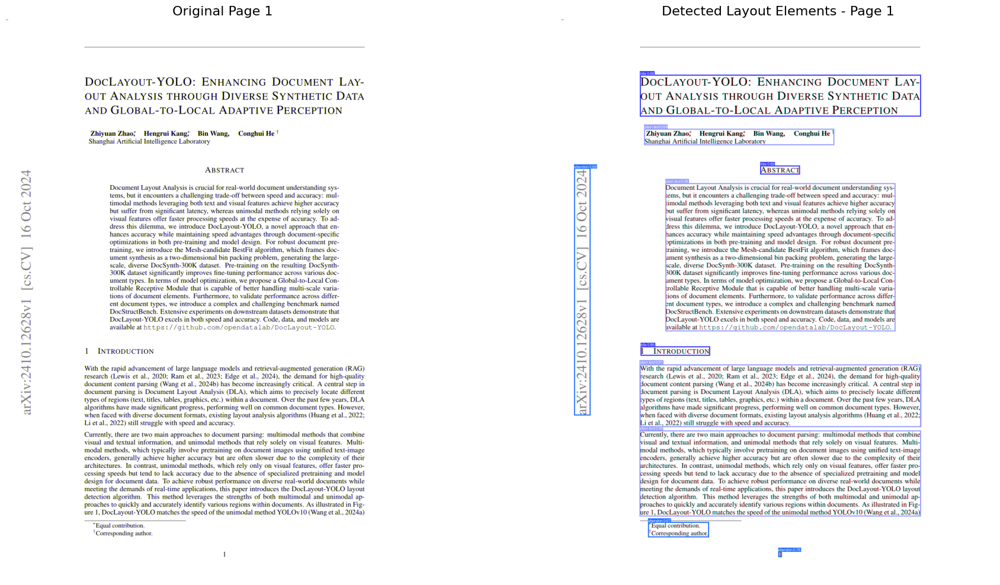


Page 1 - Detected 11 layout elements:
  - abandon: 3
  - plain text: 5
  - title: 3


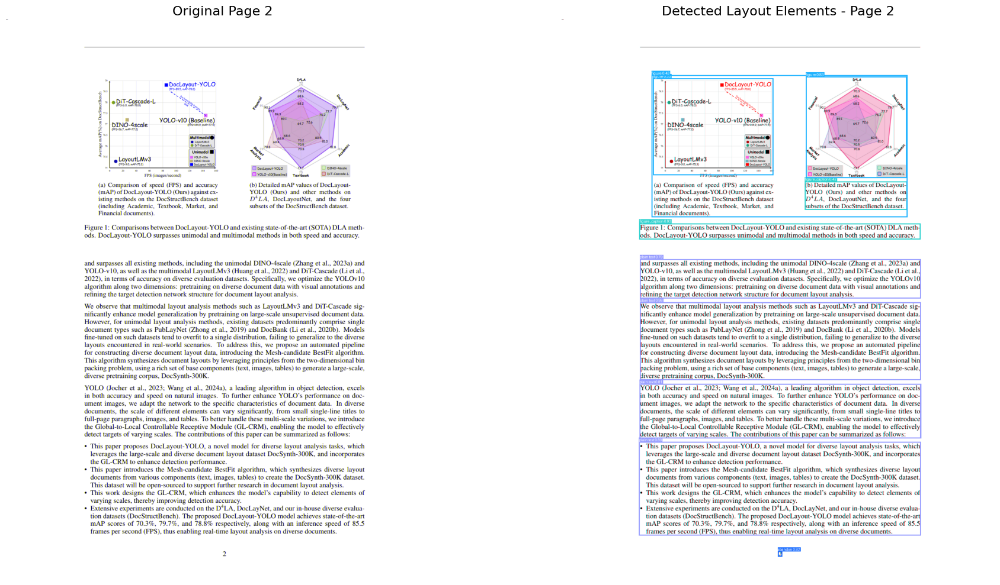


Page 2 - Detected 12 layout elements:
  - abandon: 1
  - figure: 3
  - figure_caption: 2
  - plain text: 6


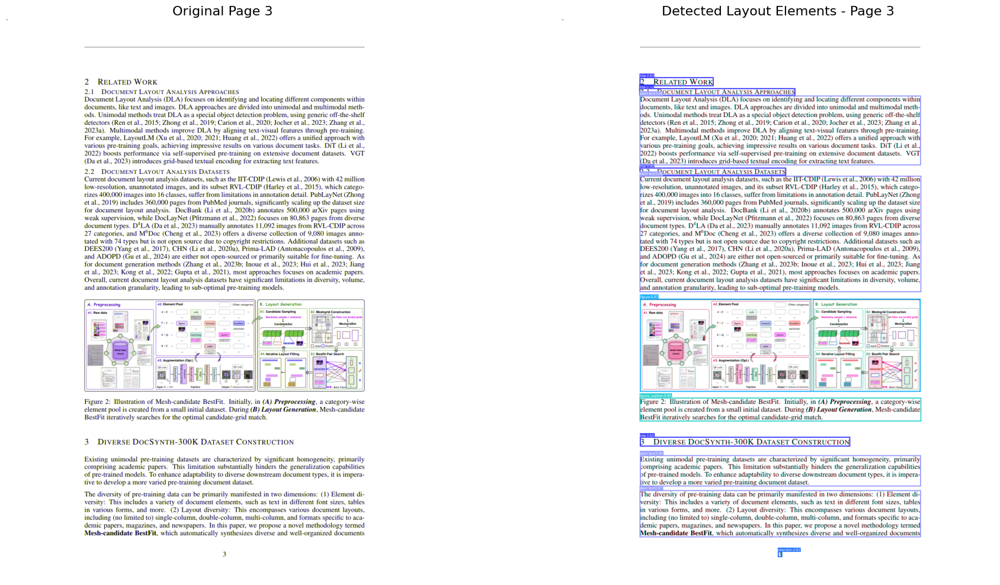


Page 3 - Detected 12 layout elements:
  - abandon: 1
  - figure: 1
  - figure_caption: 1
  - plain text: 4
  - title: 5


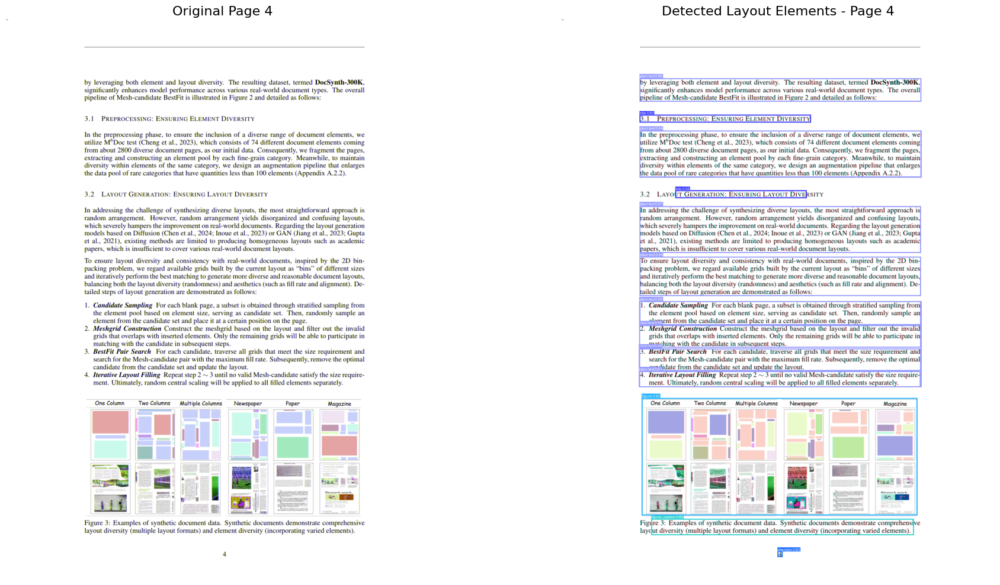


Page 4 - Detected 15 layout elements:
  - abandon: 1
  - figure: 1
  - figure_caption: 1
  - plain text: 10
  - title: 2


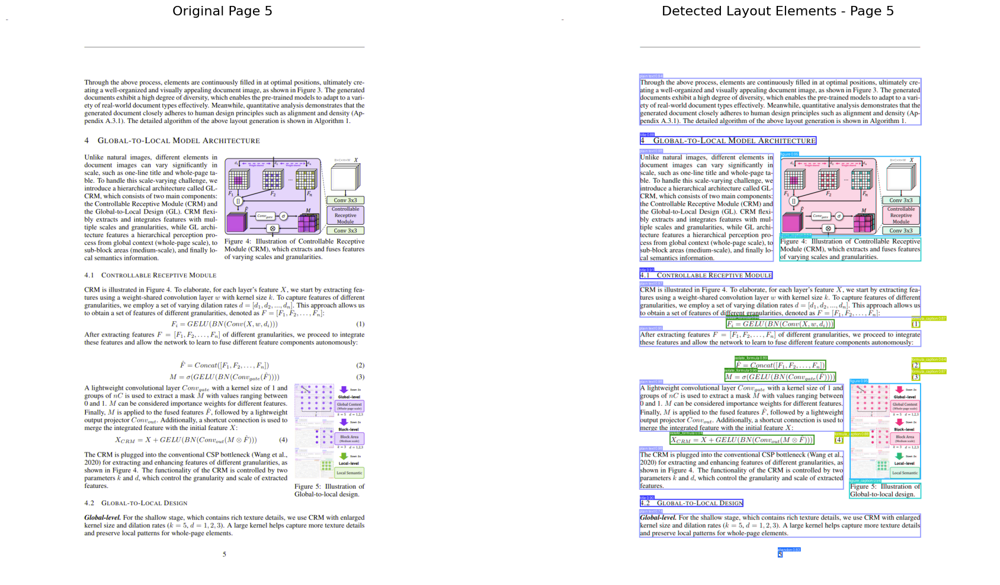


Page 5 - Detected 25 layout elements:
  - abandon: 1
  - figure: 2
  - figure_caption: 2
  - formula_caption: 5
  - isolate_formula: 4
  - plain text: 8
  - title: 3


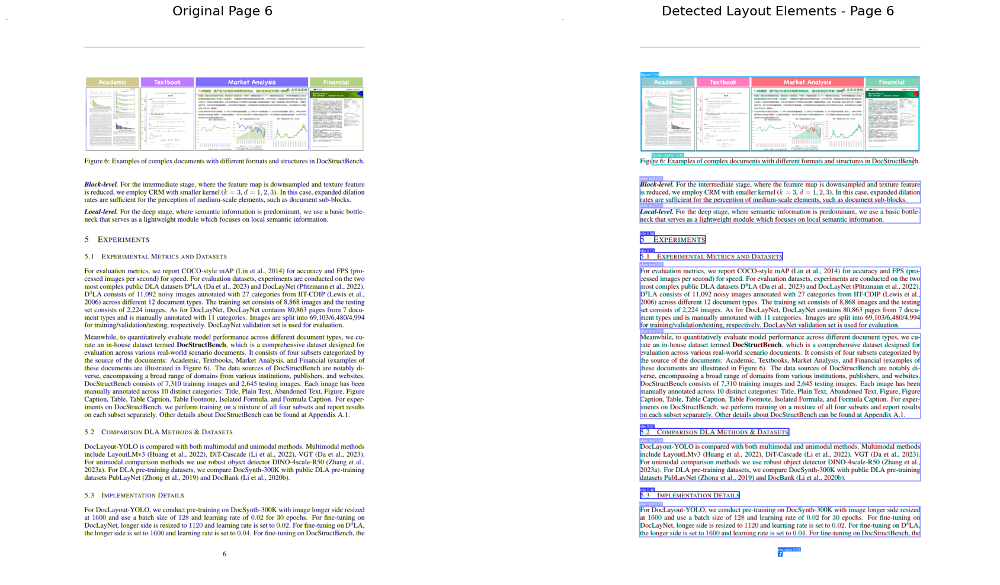


Page 6 - Detected 15 layout elements:
  - abandon: 1
  - figure: 1
  - figure_caption: 1
  - plain text: 7
  - title: 5


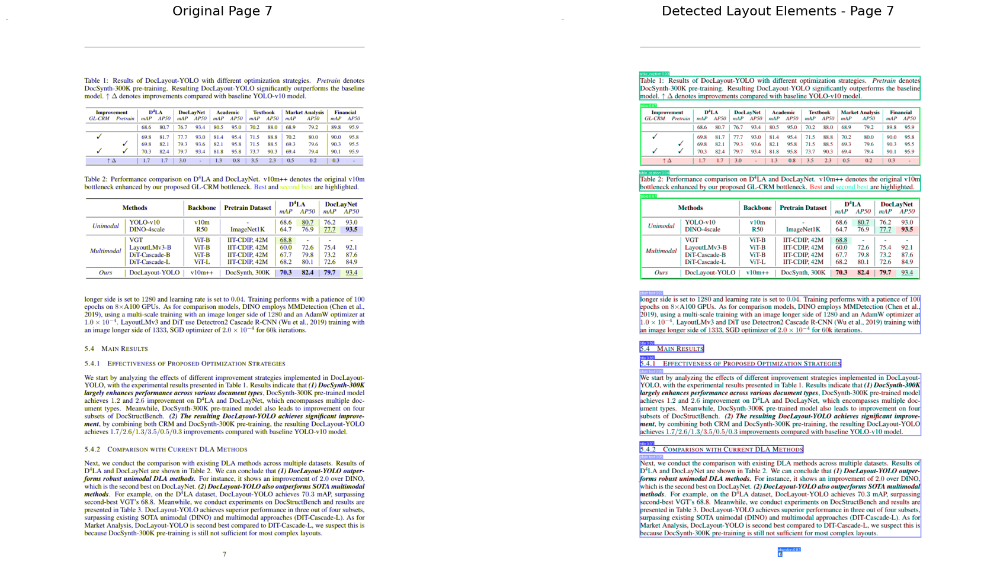


Page 7 - Detected 11 layout elements:
  - abandon: 1
  - plain text: 3
  - table: 2
  - table_caption: 2
  - title: 3


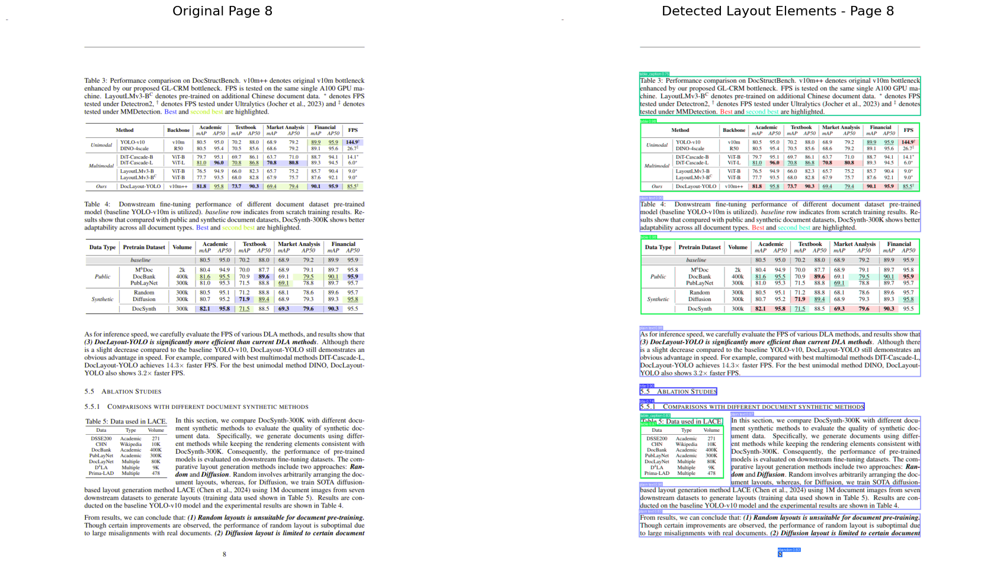


Page 8 - Detected 14 layout elements:
  - abandon: 1
  - plain text: 6
  - table: 3
  - table_caption: 2
  - title: 2


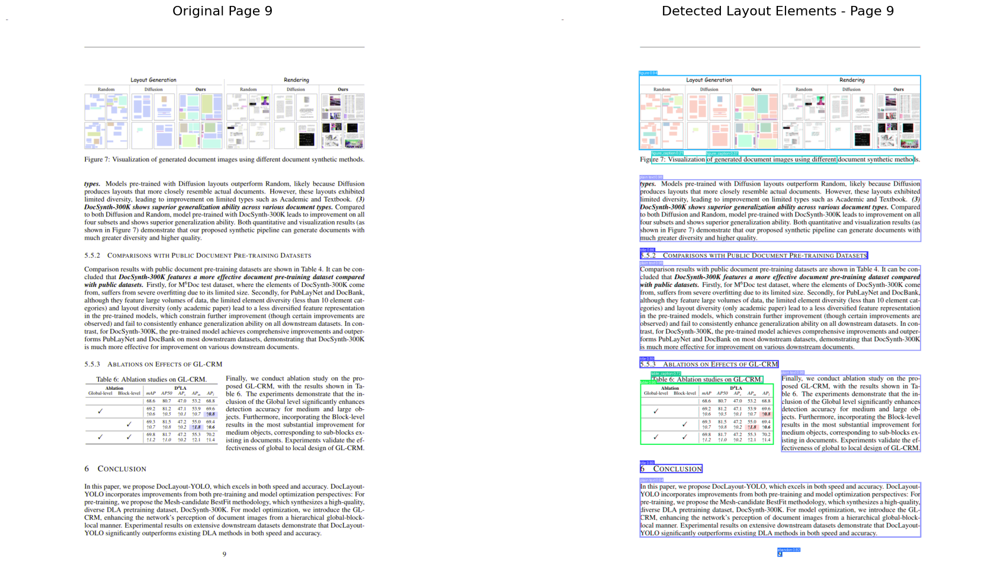


Page 9 - Detected 15 layout elements:
  - abandon: 1
  - figure: 1
  - figure_caption: 2
  - plain text: 5
  - table: 1
  - table_caption: 1
  - title: 4


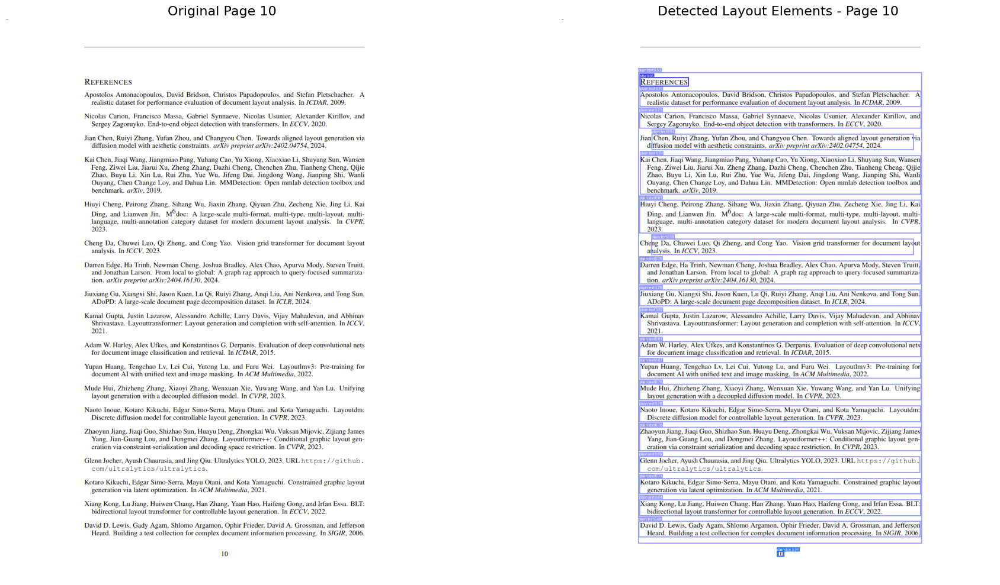


Page 10 - Detected 21 layout elements:
  - abandon: 1
  - plain text: 19
  - title: 1


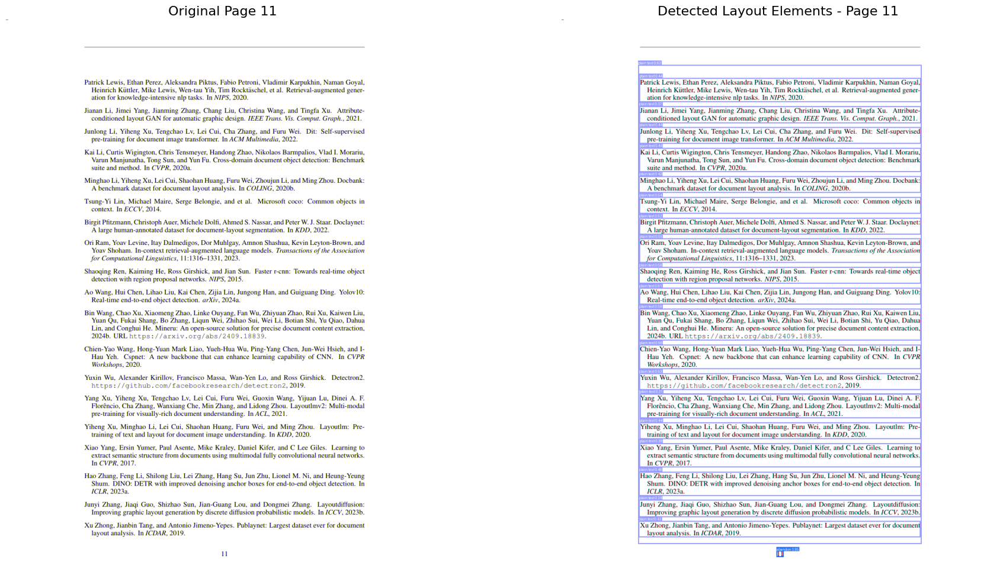


Page 11 - Detected 22 layout elements:
  - abandon: 1
  - plain text: 21


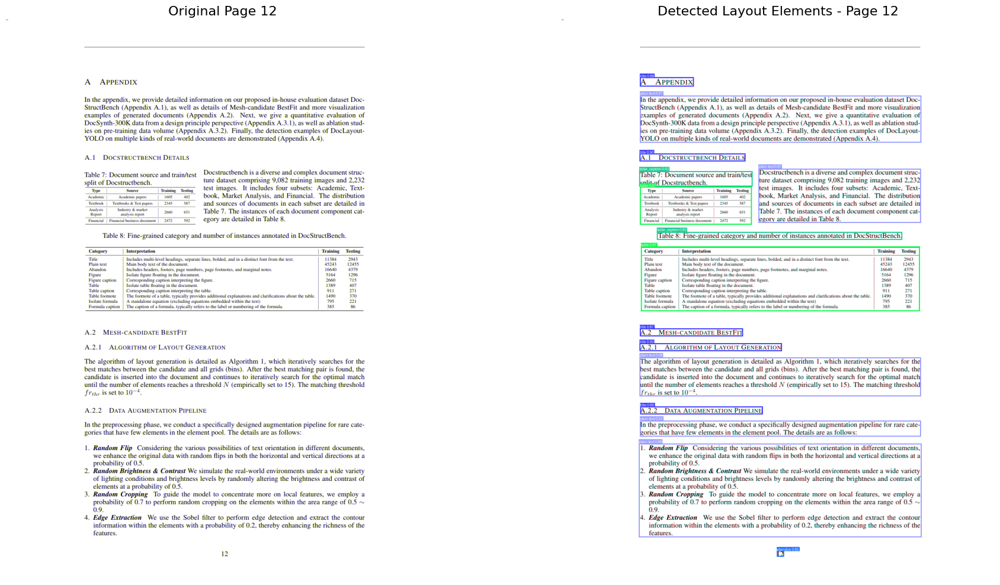


Page 12 - Detected 15 layout elements:
  - abandon: 1
  - plain text: 5
  - table: 2
  - table_caption: 2
  - title: 5


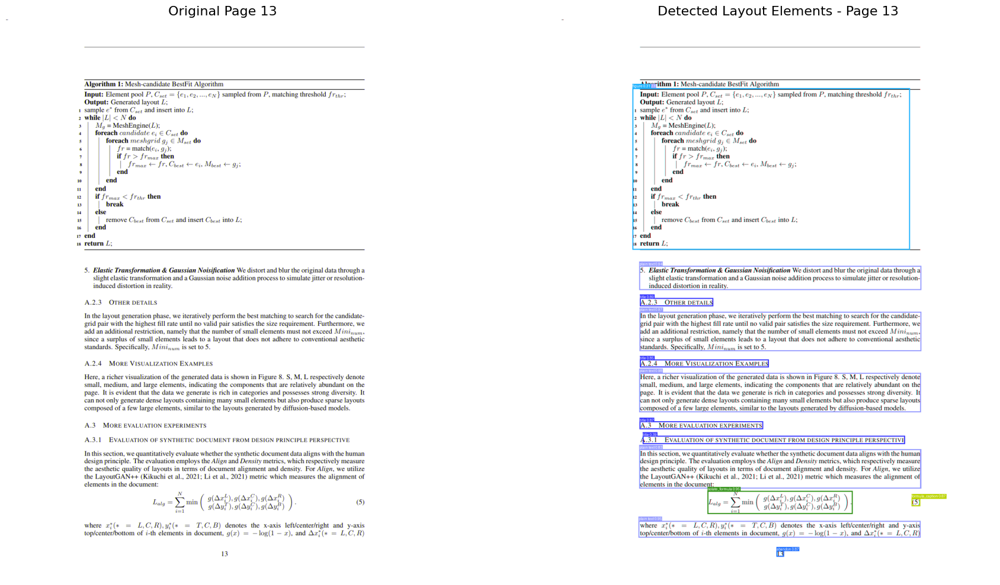


Page 13 - Detected 15 layout elements:
  - abandon: 1
  - figure: 1
  - formula_caption: 1
  - isolate_formula: 1
  - plain text: 7
  - title: 4


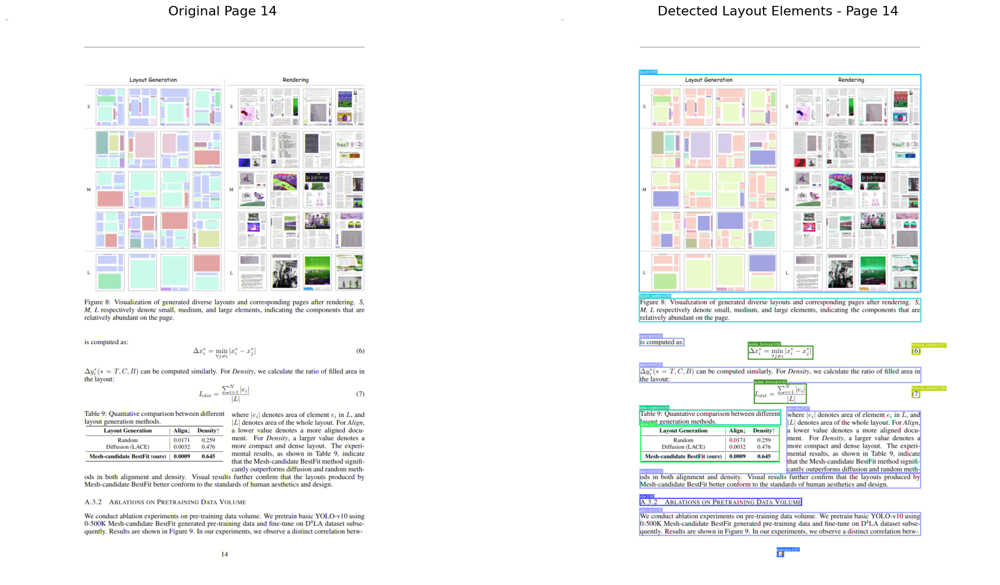


Page 14 - Detected 15 layout elements:
  - abandon: 1
  - figure: 1
  - figure_caption: 1
  - formula_caption: 2
  - isolate_formula: 2
  - plain text: 5
  - table: 1
  - table_caption: 1
  - title: 1


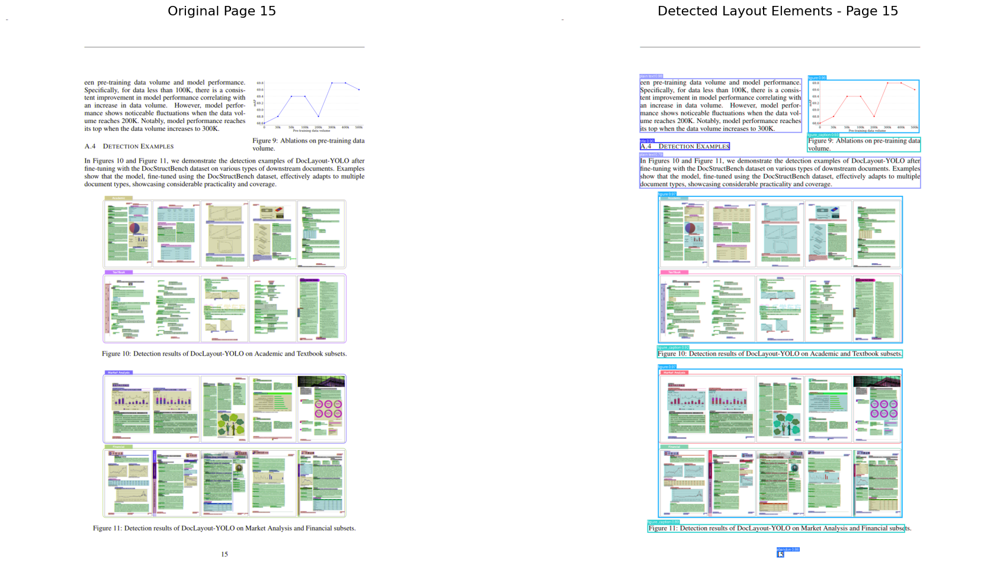


Page 15 - Detected 11 layout elements:
  - abandon: 1
  - figure: 3
  - figure_caption: 3
  - plain text: 3
  - title: 1


In [8]:
# Visualize all pages
annotated_images: List = []

for page_index, (page_image, detection_result) in enumerate(zip(pdf_page_images, detection_results)):
    page_number: int = page_index + 1
    annotated_image = visualize_page_layout(page_image, detection_result, page_number)
    annotated_images.append(annotated_image)

## Save Annotated Images

Saves all annotated pages to `data/output/`.

In [9]:
# Optional: Save annotated images
output_directory: Path = Path("../data/output")
output_directory.mkdir(exist_ok=True)

for page_index, annotated_image in enumerate(annotated_images):
    output_path: Path = output_directory / f"{pdf_path.stem}_page_{page_index + 1}_annotated.png"
    
    # Convert numpy array to PIL Image if needed
    if isinstance(annotated_image, np.ndarray):
        Image.fromarray(annotated_image).save(output_path)
    else:
        annotated_image.save(output_path)
    
    print(f"Saved: {output_path}")

print(f"\nAll annotated images saved to {output_directory}")

Saved: ..\data\output\2410.12628v1_page_1_annotated.png
Saved: ..\data\output\2410.12628v1_page_2_annotated.png
Saved: ..\data\output\2410.12628v1_page_3_annotated.png
Saved: ..\data\output\2410.12628v1_page_4_annotated.png
Saved: ..\data\output\2410.12628v1_page_5_annotated.png
Saved: ..\data\output\2410.12628v1_page_6_annotated.png
Saved: ..\data\output\2410.12628v1_page_7_annotated.png
Saved: ..\data\output\2410.12628v1_page_8_annotated.png
Saved: ..\data\output\2410.12628v1_page_9_annotated.png
Saved: ..\data\output\2410.12628v1_page_10_annotated.png
Saved: ..\data\output\2410.12628v1_page_11_annotated.png
Saved: ..\data\output\2410.12628v1_page_12_annotated.png
Saved: ..\data\output\2410.12628v1_page_13_annotated.png
Saved: ..\data\output\2410.12628v1_page_14_annotated.png
Saved: ..\data\output\2410.12628v1_page_15_annotated.png

All annotated images saved to ..\data\output


### Checkpoint: Layout Detection Complete

**You can stop here if you only need layout detection!**

Your annotated images are saved in `data/output/`. 

The next section adds OCR text extraction (adds ~5-10 min processing time). Skip it if you don't need the actual text content.


## Extract Text with OCR

Using EasyOCR to extract actual text from each detected layout element. Crops each element, runs OCR, stores text with type and location.

In [10]:
# Install and import EasyOCR
print("Setting up OCR engine...")
try:
    import easyocr
except ImportError:
    print("Installing EasyOCR (this may take a few minutes)...")
    import subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "easyocr"])
    import easyocr

# Initialize EasyOCR reader (English by default, add more languages as needed)
print("Initializing OCR reader (this may take a moment on first run)...")
ocr_reader = easyocr.Reader(['en'], gpu=torch.cuda.is_available())
print("OCR reader ready!")

Setting up OCR engine...


Using CPU. Note: This module is much faster with a GPU.


Initializing OCR reader (this may take a moment on first run)...
OCR reader ready!


In [11]:
# Extract text from detected layout elements
print("Extracting text from detected layout elements...")

# Store OCR results for all pages
ocr_results_per_page: List[List[Dict]] = []

for page_index, (page_image, detection_result) in enumerate(zip(pdf_page_images, detection_results)):
    page_number: int = page_index + 1
    print(f"\nProcessing page {page_number}/{len(pdf_page_images)}...")

    page_ocr_results: List[Dict] = []

    if hasattr(detection_result, 'boxes') and detection_result.boxes is not None:
        boxes = detection_result.boxes

        # Convert PIL Image to numpy array for processing
        page_array: np.ndarray = np.array(page_image)

        # Process each detected element
        for box_index, box in enumerate(boxes):
            # Get bounding box coordinates
            x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())

            # Get element type
            class_id: int = int(box.cls.cpu().numpy()[0])
            element_type: str = detection_result.names[class_id]

            # Get confidence score
            confidence: float = float(box.conf.cpu().numpy()[0])

            # Crop the element from the page
            cropped_element: np.ndarray = page_array[y1:y2, x1:x2]

            # Skip if cropped area is too small
            if cropped_element.shape[0] < 10 or cropped_element.shape[1] < 10:
                continue

            # Apply OCR to the cropped element
            try:
                ocr_text_results = ocr_reader.readtext(cropped_element, detail=0)
                extracted_text: str = " ".join(ocr_text_results)
            except Exception as e:
                extracted_text = f"[OCR Error: {str(e)}]"

            # Store the result
            element_data: Dict = {
                'page': page_number,
                'element_type': element_type,
                'confidence': confidence,
                'bbox': (x1, y1, x2, y2),
                'text': extracted_text
            }
            page_ocr_results.append(element_data)

            # Print progress for text-heavy elements
            if element_type in ['plain text', 'title'] and extracted_text and len(extracted_text) > 50:
                print(f"  [{element_type}] {extracted_text[:80]}...")

    ocr_results_per_page.append(page_ocr_results)
    print(f"  Extracted text from {len(page_ocr_results)} elements")

print(f"\nOCR complete! Processed {len(ocr_results_per_page)} pages")

Extracting text from detected layout elements...

Processing page 1/15...
  [plain text] Document Layout Analysis is crucial for real-world document understanding sys- t...
  [plain text] Currently; there are two main approaches to document parsing: multimodal methods...
  [title] DOcLAYOUT-YOLO: ENHANCING DOCUMENT LAY- OUT ANALYSIS THROUGH DIVERSE SYNTHETIC D...
  [plain text] Zhiyuan Zhao; Hengrui Kang; Bin Conghui He Shanghai Artificial Intelligence Labo...
  [plain text] With the advancement of large language models and retrieval-augmented generation...
  [plain text] With the rapid advancement of large language models and retrieval-augmented gene...
  Extracted text from 11 elements

Processing page 2/15...
  [plain text] We observe that multimodal layout analysis methods such LayoutLMv3 and DiT-Casca...
  [plain text] This paper proposes DocLayout-YOLO a novel model for diverse layout analysis tas...
  [plain text] YOLO (Jocher et al. 2023; et al. 2024a) . leading algorithm in ob

In [12]:
# Display sample OCR results
print("Sample OCR Results (First Page):\n")
print("=" * 80)

if ocr_results_per_page and len(ocr_results_per_page[0]) > 0:
    for element in ocr_results_per_page[0][:5]:  # Show first 5 elements
        print(f"\n{element['element_type'].upper()}")
        print(f"   Confidence: {element['confidence']:.2%}")
        print(f"   Location: {element['bbox']}")
        if element['text']:
            # Truncate long text
            display_text: str = element['text'][:200] + "..." if len(element['text']) > 200 else element['text']
            print(f"   Text: {display_text}")
        print("-" * 80)
else:
    print("No OCR results available")

# Count elements by type across all pages
element_type_counts: Dict[str, int] = {}
total_elements: int = 0

for page_results in ocr_results_per_page:
    for element in page_results:
        element_type: str = element['element_type']
        element_type_counts[element_type] = element_type_counts.get(element_type, 0) + 1
        total_elements += 1

print(f"\n\nTotal OCR Summary:")
print(f"Total elements processed: {total_elements}")
print("\nElements by type:")
for element_type, count in sorted(element_type_counts.items(), key=lambda x: x[1], reverse=True):
    print(f"  {element_type}: {count}")

Sample OCR Results (First Page):


PLAIN TEXT
   Confidence: 98.26%
   Location: (293, 463, 943, 882)
   Text: Document Layout Analysis is crucial for real-world document understanding sys- tems, but it encounters a challenging trade-off between speed and accuracy: mul- timodal methods leveraging both text and...
--------------------------------------------------------------------------------

PLAIN TEXT
   Confidence: 98.22%
   Location: (220, 1163, 1015, 1406)
   Text: Currently; there are two main approaches to document parsing: multimodal methods that combine visual and textual information; and unimodal methods that rely on visual features Multi- modal methods; wh...
--------------------------------------------------------------------------------

TITLE
   Confidence: 95.76%
   Location: (221, 156, 1015, 274)
   Text: DOcLAYOUT-YOLO: ENHANCING DOCUMENT LAY- OUT ANALYSIS THROUGH DIVERSE SYNTHETIC DATA AND GLOBAL-TO-LOCAL ADAPTIVE PERCEPTION
------------------------------------------

Visual verification - shows cropped layout elements side-by-side with extracted text.

In [13]:
# Function to sort elements by reading order (top-to-bottom, left-to-right)
def sort_by_reading_order(elements: List[Dict]) -> List[Dict]:
    """Sort layout elements by natural reading order (top-to-bottom, left-to-right)"""
    
    # Sort primarily by vertical position (y1), secondarily by horizontal position (x1)
    sorted_elements = sorted(elements, key=lambda e: (e['bbox'][1], e['bbox'][0]))
    return sorted_elements

# Visualize a page with reading order
def visualize_page_with_reading_order(page_image: Image.Image, elements: List[Dict], page_num: int):
    """Visualize page with numbered reading order and extracted text"""
    
    fig, axes = plt.subplots(1, 2, figsize=(20, 12))
    
    # Left: Original page with numbered boxes
    page_array: np.ndarray = np.array(page_image)
    axes[0].imshow(page_array)
    axes[0].set_title(f"Page {page_num} - Reading Order", fontsize=16, fontweight='bold')
    axes[0].axis('off')
    
    # Sort elements by reading order
    sorted_elements = sort_by_reading_order(elements)
    
    # Color map for different element types
    color_map: Dict[str, str] = {
        'title': 'red',
        'plain text': 'blue',
        'figure': 'green',
        'table': 'purple',
        'figure_caption': 'orange',
        'table_caption': 'brown',
        'isolate_formula': 'magenta',
        'formula_caption': 'pink'
    }
    
    # Draw boxes with reading order numbers
    for order_index, element in enumerate(sorted_elements, start=1):
        x1, y1, x2, y2 = element['bbox']
        element_type: str = element['element_type']
        color: str = color_map.get(element_type, 'gray')
        
        # Draw rectangle
        rect = patches.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            linewidth=2, edgecolor=color, facecolor='none'
        )
        axes[0].add_patch(rect)
        
        # Add reading order number
        axes[0].text(
            x1, y1 - 5,
            f"{order_index}",
            color='white',
            fontsize=12,
            fontweight='bold',
            bbox=dict(boxstyle='circle', facecolor=color, alpha=0.8)
        )
    
    # Right: Text content in reading order
    axes[1].axis('off')
    axes[1].set_title(f"Page {page_num} - Extracted Text (Reading Order)", fontsize=16, fontweight='bold')
    
    # Create text display
    text_display: str = ""
    for order_index, element in enumerate(sorted_elements, start=1):
        element_type: str = element['element_type'].upper()
        text_content: str = element['text']
        
        # Format based on element type
        if element_type in ['TITLE']:
            text_display += f"\n{'='*80}\n"
            text_display += f"[{order_index}] {element_type}\n"
            text_display += f"{text_content}\n"
            text_display += f"{'='*80}\n"
        elif element_type in ['PLAIN TEXT', 'PLAIN_TEXT']:
            text_display += f"\n[{order_index}] {text_content}\n"
        elif element_type in ['FIGURE', 'TABLE']:
            text_display += f"\n[{order_index}] {element_type}\n"
            if text_content:
                text_display += f"  (Content: {text_content[:100]}...)\n"
        elif 'CAPTION' in element_type:
            text_display += f"\n[{order_index}] {element_type}: {text_content}\n"
        elif 'FORMULA' in element_type:
            text_display += f"\n[{order_index}] {element_type}\n"
            if text_content:
                text_display += f"  {text_content}\n"
        else:
            text_display += f"\n[{order_index}] {element_type}: {text_content[:100]}...\n"
    
    # Display as text
    axes[1].text(
        0.05, 0.95, text_display,
        transform=axes[1].transAxes,
        fontsize=9,
        verticalalignment='top',
        fontfamily='monospace',
        wrap=True
    )
    
    plt.tight_layout()
    plt.show()

Visualizing document structure with reading order...



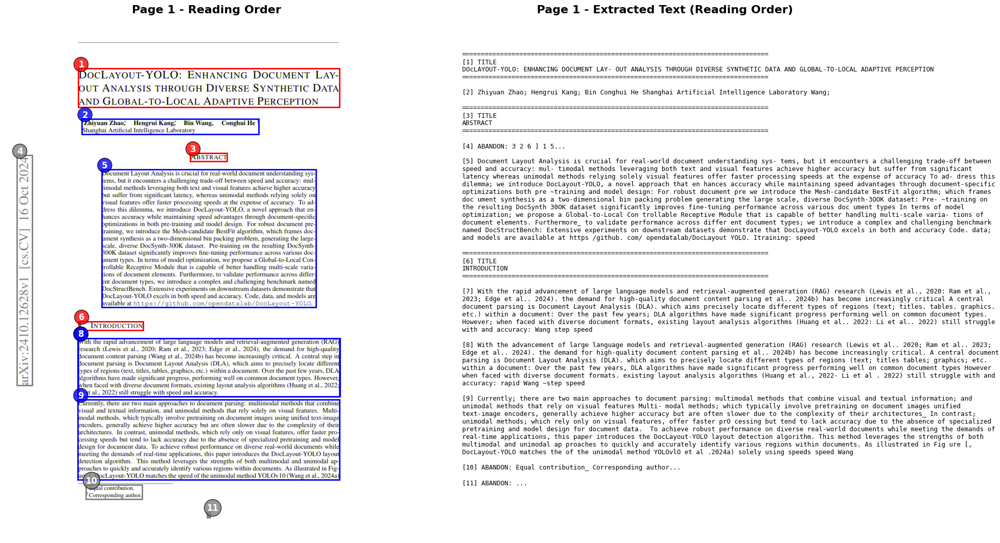

In [14]:
# Visualize first page with reading order and extracted text
print("Visualizing document structure with reading order...\n")

# Select a page to visualize (change page_index to view different pages)
page_to_visualize: int = 0  # First page (0-indexed)

if ocr_results_per_page and len(ocr_results_per_page) > page_to_visualize:
    visualize_page_with_reading_order(
        pdf_page_images[page_to_visualize],
        ocr_results_per_page[page_to_visualize],
        page_to_visualize + 1
    )
else:
    print(f"No OCR results available for page {page_to_visualize + 1}")

## What's Next?

Now that you have the OCR results, here's what you can do:

**Load and use the JSON:**
```python
import json
with open('data/output/yourfile_ocr_results.json') as f:
    data = json.load(f)

# Get all text from a specific page
page_1_text = [elem['text'] for elem in data['pages'][0]['elements']]

# Find all titles
titles = [elem['text'] for page in data['pages'] 
          for elem in page['elements'] 
          if elem['element_type'] == 'title']

# Export to markdown, feed to LLM, build search index, etc.
```

**Common use cases:**
- Convert PDFs to structured markdown
- Build searchable document database
- Extract specific sections (methods, results, etc.)
- Feed document structure to RAG systems
- Analyze document layouts at scale


### Tweak Settings

**Detection sensitivity:**
- More: `model.predict(images, conf=0.1)`
- Less: `model.predict(images, conf=0.5)`

**Image size:**
- Better quality: `imgsz=1600`
- Faster: `imgsz=800`

**Multi-language OCR:**
```python
ocr_reader = easyocr.Reader(['en', 'de', 'fr', 'es'])
```

**Batch process PDFs:**
```python
for pdf_path in Path("../data").glob("*.pdf"):
    # Your processing code
```

## Resources

- [DocLayout-YOLO](https://github.com/opendatalab/DocLayout-YOLO) - Original repo & paper
- [PDF-Extract-Kit](https://github.com/opendatalab/PDF-Extract-Kit) - Full PDF extraction toolkit
- [EasyOCR](https://github.com/JaidedAI/EasyOCR) - 80+ language OCR
- [Paper: arXiv:2410.12628](https://arxiv.org/abs/2410.12628)